In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time

In [ ]:
main_url = "https://www.newsbeast.gr/lifestyle/page/"

teaser_soups_list = []

for i in range(3, 5):
  page_url = main_url + str(i)
  page = requests.get(page_url)
  teaser_soup = BeautifulSoup(page.text, 'html.parser')
  print(f"Now Scraping page: {i}")
  teaser_soups_list.append(teaser_soup)
  time.sleep(2)

Now Scraping page: 3
Now Scraping page: 4


In [ ]:
#print(teaser_soup.prettify())

In [ ]:
teaser_soups_list[0].find_all('div', {'class': 'jsx-107431441 articleDisplay'})

In [ ]:
teaser_soups_list[0].find('div', {'class': 'jsx-107431441 articleDisplay'}).find('h4').find('a').text

'Βασίλης Παπακωνσταντίνου: Ενοχλήθηκα που μας χώριζαν με την Ελένη Ράντου – Έκανα ψυχανάλυση και την κράτησα στη ζωή μου'

In [ ]:
teaser_soups_list[0].find('div', {'class': 'jsx-107431441 articleDisplay'}).find('h4').find('a')['href']

'/lifestyle/arthro/9727427/vasilis-papakonstantinou-enochlithika-pou-mas-chorizan-me-tin-eleni-rantou-ekana-psychanalysi-kai-tin-kratisa-sti-zoi-mou'

In [ ]:
teaser_soups_list[0].find('div', {'class': 'jsx-107431441 articleDisplay'}).find('a', {'class':'subtitle'}).text

'«Όταν γεννήθηκε η κόρη μου αγάπησα πιο πολύ τα παιδιά όλου του κόσμου»'

In [ ]:
teaser_soups_list[0].find('div', {'class': 'jsx-107431441 articleDisplay'}).find('time').text

'01/06/2023 13:12'

In [ ]:
teaser_articles_list = []
for teaser_soup in teaser_soups_list:
  teaser_articles = teaser_soup.find_all('div', {'class': 'jsx-107431441 articleDisplay'})
  for teaser_article in teaser_articles:
    teaser_article_dict = {}
    h4_a = teaser_article.find('h4').find('a')
    if h4_a:
      teaser_article_dict['Title'] = h4_a.text
      if ('https://') not in h4_a['href']:
        teaser_article_dict['Url'] = 'https://www.newsbeast.gr' + h4_a['href']
      else :
        teaser_article_dict['Url']= h4_a['href']
      lead = teaser_article.find('a')
      all=requests.get(teaser_article_dict['Url'])
      all_ar=BeautifulSoup(all.text, 'html.parser')
      whole_ar=all_ar.find('div',{'class':'jsx-2277262082'})
      if whole_ar:
        whole_ar=whole_ar.text
      teaser_article_dict['Article_content']=whole_ar
    if lead:
      teaser_article_dict['Lead'] = lead.text
    section = teaser_article.find('a', {'class': 'category'})
    if section:
      teaser_article_dict['Section'] = section.text
    datetime = teaser_article.find('time')
    if datetime:
      teaser_article_dict['Datetime'] = datetime.text
    teaser_articles_list.append(teaser_article_dict)

# Δημιουργία του dataframe
news_beast_teaser_articles_df = pd.DataFrame(teaser_articles_list)
news_beast_teaser_articles_df.to_csv("news.csv", index=False)
news_beast_teaser_articles_df

In [ ]:
#!python -m spacy download el_core_news_sm

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import datetime as Datetime

from google.colab import drive
drive.mount('gdrive')

Mounted at gdrive


In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
news_beast_teaser_articles_df = pd.read_csv("/content/news.csv")
news_beast_teaser_articles_df

In [ ]:
print(news_beast_teaser_articles_df.shape)
print(f"dtype of 'Datetime' is: {news_beast_teaser_articles_df.Datetime.dtypes}. To θέλουμε σε datetime64[ns]") #
news_beast_teaser_articles_df.head(1)


In [ ]:
news_beast_teaser_articles_df.dtypes

Title                      object
Url                        object
Article_content            object
Lead                       object
Section                    object
Datetime           datetime64[ns]
dtype: object

In [ ]:
news_beast_teaser_articles_df[news_beast_teaser_articles_df['Datetime'].str.contains('Upd')]

In [ ]:
news_beast_teaser_articles_df['Datetime']=news_beast_teaser_articles_df['Datetime'].str.replace('Upd: ', '')

In [ ]:
news_beast_teaser_articles_df['Datetime'] = pd.to_datetime(news_beast_teaser_articles_df.Datetime , format='%d/%m/%Y %H:%M')

In [ ]:
news_beast_teaser_articles_df.dtypes

Title                      object
Url                        object
Article_content            object
Lead                       object
Section                    object
Datetime           datetime64[ns]
dtype: object

In [ ]:
# Make a dataframe with selected columns only
news_beast_articles_df = news_beast_teaser_articles_df[['Article_content','Datetime']]

# Extract year, month and day from daytime
news_beast_articles_df['year'] = pd.DatetimeIndex(news_beast_articles_df['Datetime']).year
news_beast_articles_df['month'] = pd.DatetimeIndex(news_beast_articles_df['Datetime']).month
news_beast_articles_df['day'] = pd.DatetimeIndex(news_beast_articles_df['Datetime']).day
news_beast_articles_df['hour'] = pd.DatetimeIndex(news_beast_articles_df['Datetime']).hour
# View dataframe info
print(news_beast_articles_df.info())
news_beast_articles_df.head(1)

<Axes: >

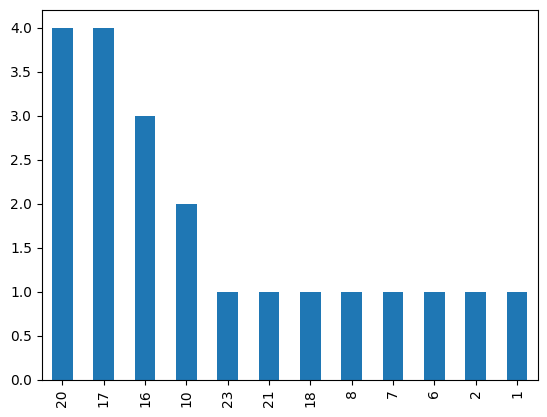

In [ ]:
news_beast_articles_df[news_beast_articles_df['day']==30]['hour'].value_counts().plot(kind='bar')


<Axes: >

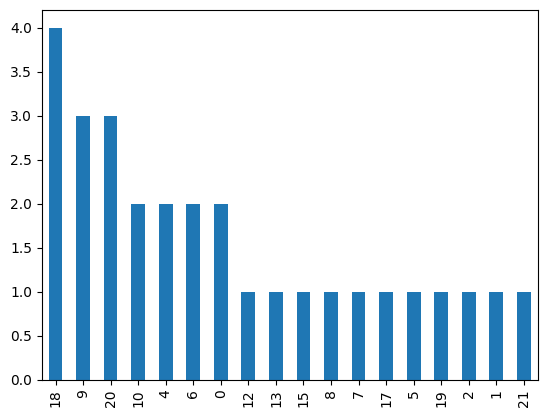

In [ ]:
news_beast_articles_df[news_beast_articles_df['day']==31]['hour'].value_counts().plot(kind='bar')

<Axes: >

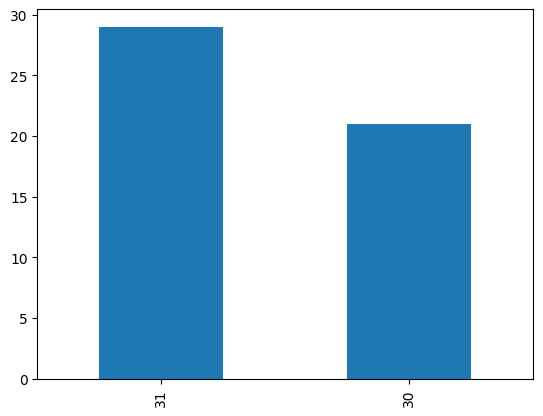

In [ ]:
news_beast_articles_df[news_beast_articles_df['day']>29]['day'].value_counts().plot(kind='bar')

<Axes: >

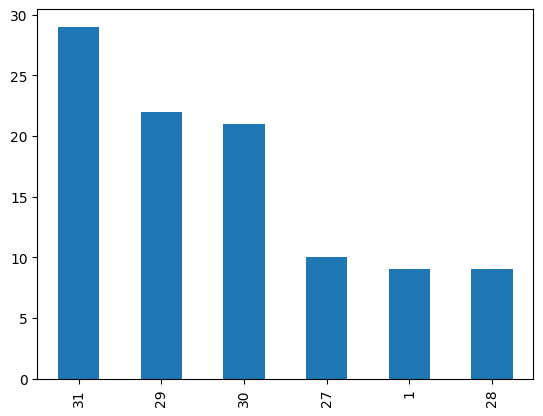

In [ ]:
news_beast_articles_df['day'].value_counts().plot(kind='bar')

In [ ]:
from wordcloud import WordCloud, STOPWORDS

In [ ]:
news_30=news_beast_articles_df[news_beast_articles_df['day']==30]

In [ ]:
text_a = news_30['Article_content'].str.cat(sep = ' ')#.replace("amp", ' ')
text_a

'\nΣτην παρέα του «The 2Night Show» της Τρίτης (30/5), καλεσμένη του Γρηγόρη Αρναούτογλου βρέθηκε η Καλή Δάβρη. Η ταλαντούχα ηθοποιός μίλησε για τα ευτυχισμένα παιδικά της χρόνια στη Χαλκίδα, την αγάπη της για την υποκριτική και μοιράστηκε άγνωστες προσωπικές της ιστορίες.\n«Δεν μου αρέσω πάντα όταν βλέπω τον εαυτό μου. Είναι άβολο να βλέπεις τον εαυτό σου και να ακούς τη φωνή σου», είπε η Καλή Δάβρη αρχικά και συνέχισε: «Είναι ευχάριστο να δίνονται ευκαιρίες στον ηθοποιό να παίζουν και δράμα και κωμωδία αλλά ο κόσμος δεν το δέχεται εύκολα. Φέτος που μου έδωσαν δραματικές σκηνές, άκουσα καλά λόγια».\nΚι έπειτα μίλησε για τους γονείς της, αφού ο παρουσιαστής τη ρώτη για το αν οι γονείς της την καμαρώνουν για το ρόλο που υποδύεται στο σίριαλ «Ο Παράδεισος των Κυριών». «Οι γονείς μου ήταν υποστηρικτικοί όταν τους είπα ότι θα γίνω ηθοποιός. Ήξεραν ότι δεν θα γίνω πλούσια από αυτή τη δουλειά αλλά με υποστήριζαν πάντα», τόνισε.\nΜάλιστα η Καλή Δάβρη βούρκωσε, αφού ο πατέρας της έχει φύγει απ

In [ ]:
import spacy

nlp = spacy.load('el_core_news_sm')

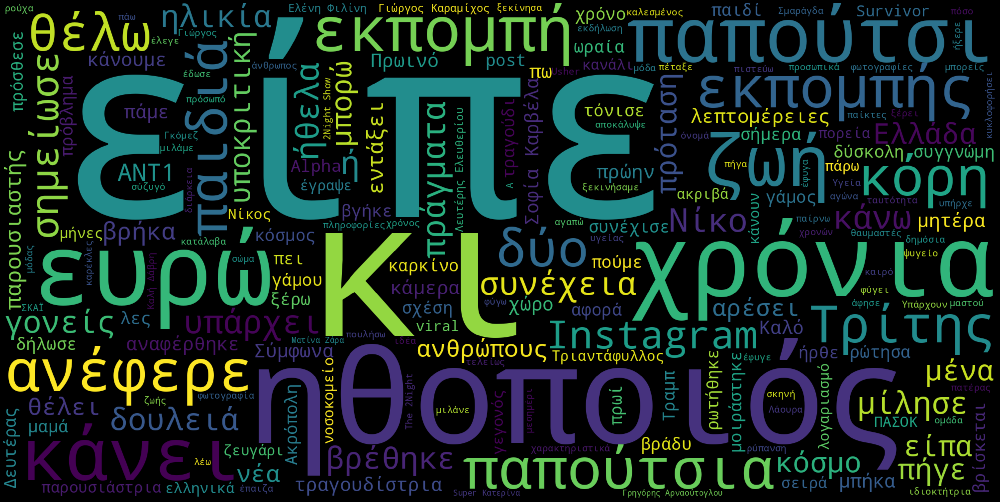

In [ ]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
    ).generate(text_a)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
doc_a = nlp(text_a)
lemma_text_a = ' '.join(token.lemma_ for token in doc_a)

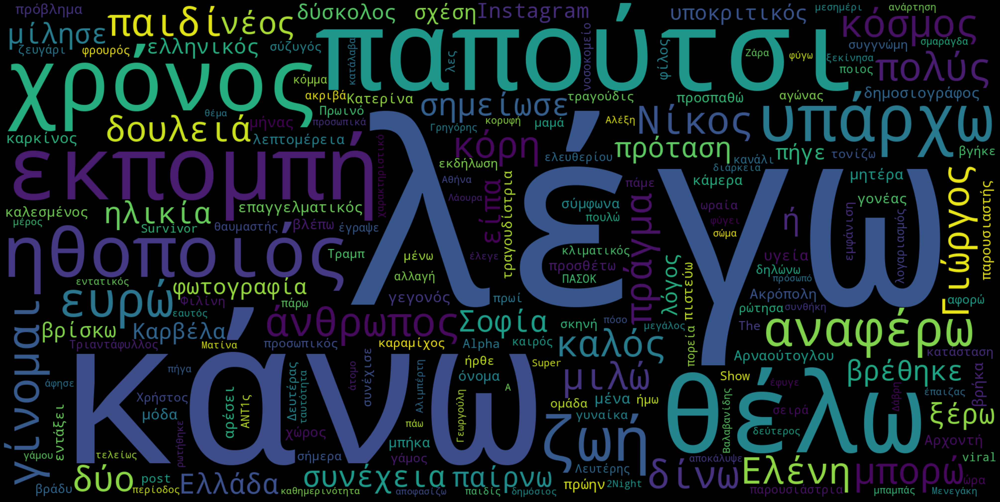

In [ ]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    collocations=False,
    width = 2000,
    height = 1000,
    background_color = 'black'
    ).generate(lemma_text_a)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
news_31=news_beast_articles_df[news_beast_articles_df['day']==31]

In [ ]:
text_b = news_31['Article_content'].str.cat(sep = ' ')#.replace("amp", ' ')
text_b

"\nΤην πρώτη του τηλεοπτική συνέντευξη, καλεσμένος στην εκπομπή «Πρωίαν σε είδον τη μεσημβρίαν», παραχώρησε ο Γιάννης Νικοπολίδης, ο μεγαλύτερος γιος του Αντώνη Νικοπολίδη, που από την Ουάσινγκτον όπου έκανε κλασσικές σπουδές και αγωνιζόταν ως τερματοφύλακας πλέον υπερασπίζεται τα γκολπόστ της ομάδας της Λαμίας.\n«Με το ποδόσφαιρο ξεκίνησα να ασχολούμαι από πολύ μικρός. Ήμουν 5-6 χρονών όταν έπαιξα στην πρώτη ακαδημία. Όταν ο μπαμπάς μου ήταν στο Euro, εγώ ήμουν τεσσάρων χρονών. Δε θυμάμαι τίποτα από εκείνη την περίοδο. Δεν έχω καμία ανάμνηση. Εγώ ήμουν στο χωριό στην Άρτα με τη γιαγιά, οι γονείς μου ήταν στην Πορτογαλία, αλλά δεν έχω κάποια ανάμνηση» ανέφερε αρχικά ο Γιάννης Νικοπολίδης για την έλλειψη μνημών από την κατάκτηση του Ευρωπαϊκού Κυπέλλου το 2004, όταν στην Εθνική Ομάδα αγωνιζόταν ο πατέρας του Αντώνης Νικοπολίδης.\n\nΣε άλλο σημείο, ο Γιάννης Νικοπολίδης αναφέρθηκε σε όσα θυμάται να λέει ο κόσμος στον δρόμο στον πατέρα του, αλλά και σε όσα ακούει ο ίδιος μέσα στον αγωνιστ

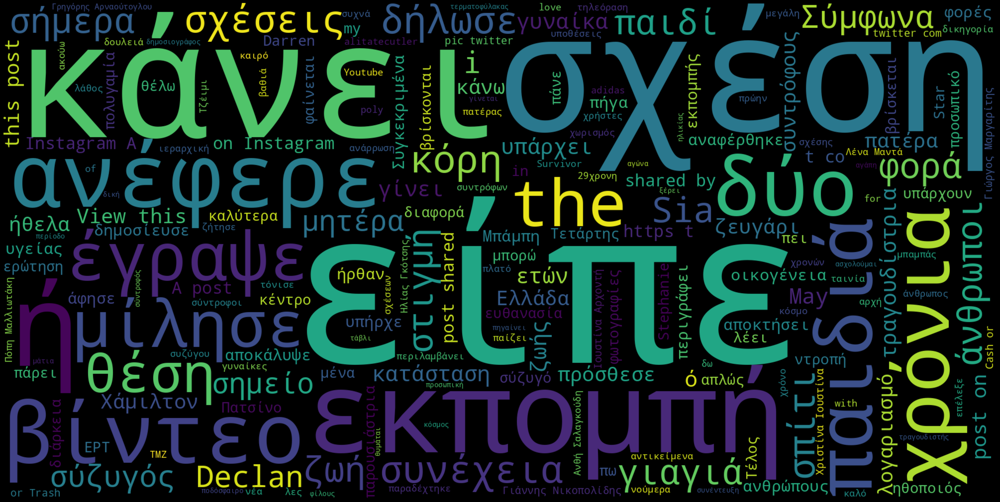

In [ ]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
    ).generate(text_b)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
doc_b = nlp(text_b)
lemma_text_b = ' '.join(token.lemma_ for token in doc_b)

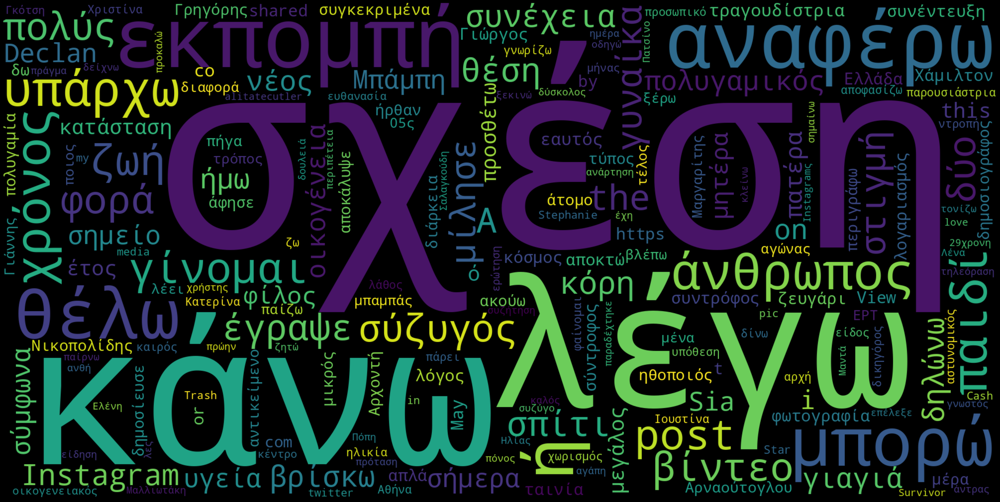

In [ ]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    collocations=False,
    width = 2000,
    height = 1000,
    background_color = 'black'
    ).generate(lemma_text_b)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Αρχικά, για τις 30 Μαϊου παρατηρούμε πως τα περισσότερα άρθρα αναρτήθηκαν στις 8 το απόγευμα και στις 5 το απόγευμα, σε σύνολο 4 άρθρα για την κάθε ώρα. Στις 4 το μεσημέρι αναρτήθηκαν 3 άρθρα και στις 10 το πρωί 2 άρθρα. Κατά την διάρκεια των υπολοίπων ωρών αναρτήθηκαν ένα ή κανένα άρθρο. Άρα στις 30 Μαϊου τα περισσότερα άρθρα κυκλοφόρησαν κατά στην διάρκεια μεσημεριανών-απογευματινών ωρών. Στις 31 Μαϊου τα περισσότερα άρθρα αναρτήθηκαν στις 6 το απόγευμα, σε σύνολο 4. Στις 9 το πρωόι και στις 8 το απόγευμα δημοσιέυτηκαν 3 άρθρα. Κατά την διάρκεια των υπολοίπω ωρών αναρτήθηκαν λιγότερα άρθρα. Παρατηρούμε, λοιπόν, ότι κατά την διάρκεια όλης της ημέρας υπήρχαν δημοσιεύσεις. Ακόμη, στις 31 του μηνός (29 άρθρα) δημοσιέυτηκαν παραπάνω άρθρα από ότι στις 30(21 άρθρα).

Όσον αφορά το περιεχόμενο των κειμένων, οι σχέσεις και οι εκοπμές αποτελούν βασικό θέμα συζήτησης στις 31 Μαϊου. Βλέπουμε επίσης πολλά ρήματα που αφορούν προσωπική δράση.

Στις 30 Μαϊου κεντρικό θέμα αποτελούν ηθοποιοί, ένα ζήτημα με παπούτσι και άλλα ρήματα δράσης πάλι.